## Import Necessary Libraries 

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px
import folium
from folium.plugins import MarkerCluster 
import chardet
import json
import dask
import time
import warnings
warnings.filterwarnings("ignore")

C:\Users\Marwa\anaconda3\lib\site-packages\pandas\core\computation\expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


In [2]:
#! pip install --upgrade pandas dask

In [3]:
import dask.dataframe as dd

In [4]:
plt.style.use('seaborn-darkgrid')

## 1. Data Acquisation and Preprocessing 

In [ ]:
# Detect encoding of csv file
file = 'globalterrorismdb_0718dist.csv'
data = open(file,"rb").read()
result = chardet.detect(data)
char_encoding = result['encoding']
char_encoding

### Pandas 

In [ ]:
#%%time
dataset = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='Windows-1252', low_memory=False)

In [ ]:
start = time.time()
dataset = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='Windows-1252', low_memory=False)
end = time.time()
time_elapsed = end - start
print(f"Time elapsed {time_elapsed}")

In [8]:
# Measure memory usage of Pandas
memory_usage_pandas = dataset.memory_usage(deep=True).sum() / 1024**2  # Convert to MB
print(f"Pandas Memory Usage: {round(memory_usage_pandas,2)} MB")

Pandas Memory Usage: 631.56 MB


In [9]:
dataset.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [10]:
dataset.shape

(181691, 135)

In [11]:
# make a copy of original dataframe
df = dataset.copy()

In [ ]:
df.shape

In [ ]:
data_types = df.dtypes
data_types

In [ ]:
#data_types.to_csv('Columns_Data_types.csv')

In [ ]:
df.columns

## Check Duplicates

In [16]:
df.duplicated().sum()

0

### Check Null Values 

In [12]:
df.isna().sum()

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [13]:
# columns with null values
col_with_null = [i for i in df.columns if df[i].isna().sum()]

In [14]:
col_with_null

['approxdate',
 'resolution',
 'provstate',
 'city',
 'latitude',
 'longitude',
 'specificity',
 'location',
 'summary',
 'doubtterr',
 'alternative',
 'alternative_txt',
 'multiple',
 'attacktype2',
 'attacktype2_txt',
 'attacktype3',
 'attacktype3_txt',
 'targsubtype1',
 'targsubtype1_txt',
 'corp1',
 'target1',
 'natlty1',
 'natlty1_txt',
 'targtype2',
 'targtype2_txt',
 'targsubtype2',
 'targsubtype2_txt',
 'corp2',
 'target2',
 'natlty2',
 'natlty2_txt',
 'targtype3',
 'targtype3_txt',
 'targsubtype3',
 'targsubtype3_txt',
 'corp3',
 'target3',
 'natlty3',
 'natlty3_txt',
 'gsubname',
 'gname2',
 'gsubname2',
 'gname3',
 'gsubname3',
 'motive',
 'guncertain1',
 'guncertain2',
 'guncertain3',
 'nperps',
 'nperpcap',
 'claimed',
 'claimmode',
 'claimmode_txt',
 'claim2',
 'claimmode2',
 'claimmode2_txt',
 'claim3',
 'claimmode3',
 'claimmode3_txt',
 'compclaim',
 'weapsubtype1',
 'weapsubtype1_txt',
 'weaptype2',
 'weaptype2_txt',
 'weapsubtype2',
 'weapsubtype2_txt',
 'weaptype3',


In [15]:
# number of columns that have null values
print(f"Number of columns with null values : {len(col_with_null)} columns")

Number of columns with null values : 106 columns


In [17]:
# check if column has nulls, then append columns with nulls into list
def check_nulls():
    # percentage of null values in each column
    columns_with_nulls =[] # list of dictionaries
    for i in df.columns:
        if df[i].isna().sum():
            dic = {i : ((df[i].isna().sum())/len(df))*100} # dictionary includes {'Column_name' : percentage of null values}
            columns_with_nulls.append(dic)  
    print(f"Number of columns with nulls : {len(columns_with_nulls)}")
    return columns_with_nulls

In [18]:
# check if column has nulls, then append columns with nulls into list
def check_null_values(df):
    # percentage of null values in each column
    columns_with_nulls =[] # list of dictionaries
    for i in df.columns:
        if df[i].isna().sum():
            dic = {i : ((df[i].isna().sum())/len(df))*100} # dictionary includes {'Column_name' : percentage of null values}
            columns_with_nulls.append(dic)  
    print(f"Number of columns with nulls : {len(columns_with_nulls)}")
    return columns_with_nulls

In [19]:
# call check_nulls() function
columns_with_nulls = check_nulls()
columns_with_nulls

Number of columns with nulls : 106


[{'approxdate': 94.91499303762983},
 {'resolution': 98.77814531264619},
 {'provstate': 0.23171208260177995},
 {'city': 0.23941747252202916},
 {'latitude': 2.507554034046816},
 {'longitude': 2.5081044190411195},
 {'specificity': 0.0033023099658210917},
 {'location': 69.45638474112641},
 {'summary': 36.396409288297164},
 {'doubtterr': 0.0005503849943035153},
 {'alternative': 84.03278093026071},
 {'alternative_txt': 84.03278093026071},
 {'multiple': 0.0005503849943035153},
 {'attacktype2': 96.52486914596761},
 {'attacktype2_txt': 96.52486914596761},
 {'attacktype3': 99.7644352224381},
 {'attacktype3_txt': 99.7644352224381},
 {'targsubtype1': 5.709143545910364},
 {'targsubtype1_txt': 5.709143545910364},
 {'corp1': 23.419982277603182},
 {'target1': 0.3511456263656427},
 {'natlty1': 0.8580502061191804},
 {'natlty1_txt': 0.8580502061191804},
 {'targtype2': 93.86650962348162},
 {'targtype2_txt': 93.86650962348162},
 {'targsubtype2': 94.11913633586694},
 {'targsubtype2_txt': 94.11913633586694},

**Save the return of check_nulls() function in text file**

In [20]:
# Convert list of dictionaries to JSON string
json_data = json.dumps(columns_with_nulls, indent=4) 

file_path = 'columns_with_nulls.txt'

# Write JSON data to the file
with open(file_path, 'w') as file:
    file.write(json_data)

<font color="#153448" size="5" >Observations</font></b>
- <font size="3">Number of rows **:** <font color="#A0153E">**181691 rows**</font>.
<br><br>
- <font size="3">Number of columns **:** <font color="#A0153E">**135 columns**</font>.
<br><br>
- <font size="3">There are no duplicated rows.
 <br><br>
- <font size="3">Number of columns with null values **:** <font  color="#A0153E">**106 columns**</font>.

In [21]:
# columns of the dataframe
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)

In [22]:
df['country'].unique()

array([  58,  130,  160,   78,  101,  217,  218,   98,  499,   65,   83,
        222,  362,  199,  102,  185,   30,   60,   11,  110,   96,  209,
        158,   94,  603,   45,   26,  145,  142,   21,   38,   14,  153,
        230,  198,   49,  406,   36,   97,  161,  201,  156,  106,  155,
         15,  236,   92,   69,  428,   31,  604,  605,  162,    6,   61,
        205,   87,  195,  136,   53,  138,    4,  159,   43,   88,  235,
         59,  144,  121,  178,   29,  100,   42,  377,    7,  200,  184,
        215,  183,  104,   95,  182,  203,  186,  139,   17,  147,   20,
        207,   19,    8,  128,  173,   56,   93,  124,  403,  359,   55,
        349,   86,  137,  208,  213,  151,  111,   72,  113,   18,   89,
        174,  231,   84,   80,  532,   22,   81,  127,  221,    5,   41,
        176,   57,  164,   32,  196,  197,  116,   91,   70,   66,   33,
        143,  166,  146,  141,  204,   68,   67,   76,  122,  129,   90,
        108,  157,   44,  112,   47,  123,   75,  2

In [23]:
df['country_txt'].nunique()

205

In [24]:
df['country_txt'].unique()

array(['Dominican Republic', 'Mexico', 'Philippines', 'Greece', 'Japan',
       'United States', 'Uruguay', 'Italy', 'East Germany (GDR)',
       'Ethiopia', 'Guatemala', 'Venezuela', 'West Germany (FRG)',
       'Switzerland', 'Jordan', 'Spain', 'Brazil', 'Egypt', 'Argentina',
       'Lebanon', 'Ireland', 'Turkey', 'Paraguay', 'Iran',
       'United Kingdom', 'Colombia', 'Bolivia', 'Nicaragua',
       'Netherlands', 'Belgium', 'Canada', 'Australia', 'Pakistan',
       'Zambia', 'Sweden', 'Costa Rica', 'South Yemen', 'Cambodia',
       'Israel', 'Poland', 'Taiwan', 'Panama', 'Kuwait',
       'West Bank and Gaza Strip', 'Austria', 'Czechoslovakia', 'India',
       'France', 'South Vietnam', 'Brunei', 'Zaire',
       "People's Republic of the Congo", 'Portugal', 'Algeria',
       'El Salvador', 'Thailand', 'Haiti', 'Sudan', 'Morocco', 'Cyprus',
       'Myanmar', 'Afghanistan', 'Peru', 'Chile', 'Honduras',
       'Yugoslavia', 'Ecuador', 'New Zealand', 'Malaysia', 'Singapore',
       'Bot

In [25]:
#check if values of country_txt equal values of natlty1_txt
df['country_txt'].values == df['natlty1_txt'].values

array([ True, False, False, ...,  True,  True,  True])

In [26]:
df['region'].unique()

array([ 2,  1,  5,  8,  4,  3,  9, 11, 10, 12,  6,  7], dtype=int64)

In [27]:
df['region'].nunique()

12

In [28]:
df['region_txt'].nunique()

12

In [29]:
df['region_txt'].unique()

array(['Central America & Caribbean', 'North America', 'Southeast Asia',
       'Western Europe', 'East Asia', 'South America', 'Eastern Europe',
       'Sub-Saharan Africa', 'Middle East & North Africa',
       'Australasia & Oceania', 'South Asia', 'Central Asia'],
      dtype=object)

In [30]:
df['attacktype1'].unique()

array([1, 6, 3, 7, 2, 4, 9, 8, 5], dtype=int64)

In [31]:
df['attacktype1'].nunique()

9

In [32]:
df['attacktype1_txt'].unique()

array(['Assassination', 'Hostage Taking (Kidnapping)',
       'Bombing/Explosion', 'Facility/Infrastructure Attack',
       'Armed Assault', 'Hijacking', 'Unknown', 'Unarmed Assault',
       'Hostage Taking (Barricade Incident)'], dtype=object)

In [33]:
df['attacktype1_txt'].nunique()

9

In [34]:
df['natlty1'].unique()

array([  58.,   21.,  217.,  218.,   75.,  216.,  222.,  163.,   97.,
         15.,  199.,  102.,   65.,  185.,   nan,  101.,  422.,   60.,
        158.,  359.,   96.,   11.,  160.,   44.,  155.,  999.,  233.,
         30.,   87.,  183.,  162.,   45.,   78.,  145.,   93.,  235.,
         98.,  403.,   99.,   94.,   38.,  161.,  198.,  209.,   49.,
        167.,   95.,   51.,   69.,  120.,  229.,  142.,   43.,   89.,
        228.,  130.,  200.,   92.,  144.,  174.,    6.,  159.,  236.,
        173.,   55.,  362.,   17.,   26.,   61.,   29.,   83.,  110.,
        149.,    5.,  184.,  603.,  153.,  104.,   53.,  156.,  186.,
         59.,  121.,  136.,  182.,  147.,  139.,   12.,   20.,  106.,
        137.,   86.,  201.,  208.,  138.,  207.,  128.,   32.,  205.,
         18.,   68.,  223.,  215.,  124.,   14.,  231.,  230.,    8.,
        151.,  100.,  213.,   50.,  111.,  203.,   84.,   67.,   56.,
        113.,   63.,    4.,   88.,  604.,  123.,   19.,   80.,  220.,
         22.,  377.,

In [35]:
df['natlty1_txt'].unique()

array(['Dominican Republic', 'Belgium', 'United States', 'Uruguay',
       'Germany', 'Great Britain', 'Venezuela', 'Puerto Rico', 'Israel',
       'Austria', 'Switzerland', 'Jordan', 'Ethiopia', 'Spain', nan,
       'Japan', 'International', 'Egypt', 'Paraguay', 'Soviet Union',
       'Ireland', 'Argentina', 'Philippines', 'China',
       'West Bank and Gaza Strip', 'Multinational', 'Northern Ireland',
       'Brazil', 'Haiti', 'South Africa', 'Portugal', 'Colombia',
       'Greece', 'Nicaragua', 'Indonesia', 'Yugoslavia', 'Italy',
       'Rhodesia', 'Ivory Coast', 'Iran', 'Canada', 'Poland', 'Sweden',
       'Turkey', 'Costa Rica', 'Russia', 'Iraq', 'Cuba', 'France',
       'Malawi', 'Democratic Republic of the Congo', 'Netherlands',
       'Chile', 'Hong Kong', 'Yemen', 'Mexico', 'Syria', 'India',
       'New Zealand', 'Senegal', 'Algeria', 'Peru', 'Czechoslovakia',
       'Saudi Arabia', 'Denmark', 'West Germany (FRG)', 'Bahamas',
       'Bolivia', 'El Salvador', 'Botswana', 'Guate

In [36]:
df['natlty2'].nunique()

158

In [37]:
df['natlty2_txt'].nunique()

158

In [38]:
# specify columns with null values 
def high_null_percent(percent):
    high_null_percent_columns = []
    null_columns = check_nulls()
    for i in null_columns:
        for k,v in i.items():
             if v >= percent:
            #high_null_percent.append({k:v})
                high_null_percent_columns.append(k)
    print(f"Number of columns that have {percent}% or more null values : {len(high_null_percent_columns)} columns")
    return high_null_percent_columns

In [39]:
# call high_null_percent(percent) function
high_null_percent_col = high_null_percent(85)

Number of columns with nulls : 106
Number of columns that have 85% or more null values : 65 columns


<font color="#153448" size="5" >Observations</font><br><br>
<font size="3" > There are <font color="#A0153E">**65 columns**</font> that have <font color="#A0153E">**85% or more null values**</font> which is high percentage.<br>
- <font size="3" >I can't drop rows in this case because if I do this I will drop 85% of the whole dataset.<br>
- <font  size="3" >I see if I follow imputation approach, my dataset will have high percentage of fake data.</font>
<br>
- <font font size="3"> So I see the best descision in this case to drop the columns.</font>
------------------------------------------------------------------------------    
<font font size="3"> So I will drop the 65 columns that have 85% or more null values</font>

In [40]:
# drop column with nulls greater than 85% ---> 65 columns
df.drop(columns=high_null_percent_col,inplace=True)

In [41]:
df.shape

(181691, 70)

In [42]:
check_nulls()

Number of columns with nulls : 41


[{'provstate': 0.23171208260177995},
 {'city': 0.23941747252202916},
 {'latitude': 2.507554034046816},
 {'longitude': 2.5081044190411195},
 {'specificity': 0.0033023099658210917},
 {'location': 69.45638474112641},
 {'summary': 36.396409288297164},
 {'doubtterr': 0.0005503849943035153},
 {'alternative': 84.03278093026071},
 {'alternative_txt': 84.03278093026071},
 {'multiple': 0.0005503849943035153},
 {'targsubtype1': 5.709143545910364},
 {'targsubtype1_txt': 5.709143545910364},
 {'corp1': 23.419982277603182},
 {'target1': 0.3511456263656427},
 {'natlty1': 0.8580502061191804},
 {'natlty1_txt': 0.8580502061191804},
 {'motive': 72.17198430301997},
 {'guncertain1': 0.2091462978353358},
 {'nperps': 39.14062886989449},
 {'nperpcap': 38.24570286915698},
 {'claimed': 36.39145582334844},
 {'weapsubtype1': 11.430395561695406},
 {'weapsubtype1_txt': 11.430395561695406},
 {'weapdetail': 37.24455256451888},
 {'nkill': 5.676120446252153},
 {'nkillus': 35.470111342884344},
 {'nkillter': 36.8526784485

In [43]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country',
       'country_txt', 'region', 'region_txt', 'provstate', 'city', 'latitude',
       'longitude', 'specificity', 'vicinity', 'location', 'summary', 'crit1',
       'crit2', 'crit3', 'doubtterr', 'alternative', 'alternative_txt',
       'multiple', 'success', 'suicide', 'attacktype1', 'attacktype1_txt',
       'targtype1', 'targtype1_txt', 'targsubtype1', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1', 'natlty1_txt', 'gname', 'motive',
       'guncertain1', 'individual', 'nperps', 'nperpcap', 'claimed',
       'weaptype1', 'weaptype1_txt', 'weapsubtype1', 'weapsubtype1_txt',
       'weapdetail', 'nkill', 'nkillus', 'nkillter', 'nwound', 'nwoundus',
       'nwoundte', 'property', 'propextent', 'propextent_txt', 'propvalue',
       'propcomment', 'ishostkid', 'ransom', 'addnotes', 'scite1', 'scite2',
       'scite3', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

In [44]:
df.drop(columns=['alternative','propextent','natlty1','targtype1','targsubtype1','weaptype1','weapsubtype1','attacktype1','country','region'], inplace=True)

 <font color="#153448" size ="4">I droped 10 columns, which have corresponding columns that include the categorical value corresponding to the numerical value and I see that their numerical values don't tell us clear meaning.</font>
1. <font size ="3">country</font>
2. <font size ="3">region</font >   
3. <font size ="3">natlty1</font >
4. <font size ="3">propextent</font >
5. <font  size ="3">attacktype1</font >
6. <font  size ="3">targtype1</font >
7. <font  size ="3">targsubtype1</font >
8. <font  size ="3">weaptype1</font >
9. <font  size ="3">weapsubtype1</font >
9. <font size ="3" >alternative</font >

In [45]:
df.shape

(181691, 60)

In [46]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country_txt',
       'region_txt', 'provstate', 'city', 'latitude', 'longitude',
       'specificity', 'vicinity', 'location', 'summary', 'crit1', 'crit2',
       'crit3', 'doubtterr', 'alternative_txt', 'multiple', 'success',
       'suicide', 'attacktype1_txt', 'targtype1_txt', 'targsubtype1_txt',
       'corp1', 'target1', 'natlty1_txt', 'gname', 'motive', 'guncertain1',
       'individual', 'nperps', 'nperpcap', 'claimed', 'weaptype1_txt',
       'weapsubtype1_txt', 'weapdetail', 'nkill', 'nkillus', 'nkillter',
       'nwound', 'nwoundus', 'nwoundte', 'property', 'propextent_txt',
       'propvalue', 'propcomment', 'ishostkid', 'ransom', 'addnotes', 'scite1',
       'scite2', 'scite3', 'dbsource', 'INT_LOG', 'INT_IDEO', 'INT_MISC',
       'INT_ANY'],
      dtype='object')

In [47]:
check_nulls()

Number of columns with nulls : 36


[{'provstate': 0.23171208260177995},
 {'city': 0.23941747252202916},
 {'latitude': 2.507554034046816},
 {'longitude': 2.5081044190411195},
 {'specificity': 0.0033023099658210917},
 {'location': 69.45638474112641},
 {'summary': 36.396409288297164},
 {'doubtterr': 0.0005503849943035153},
 {'alternative_txt': 84.03278093026071},
 {'multiple': 0.0005503849943035153},
 {'targsubtype1_txt': 5.709143545910364},
 {'corp1': 23.419982277603182},
 {'target1': 0.3511456263656427},
 {'natlty1_txt': 0.8580502061191804},
 {'motive': 72.17198430301997},
 {'guncertain1': 0.2091462978353358},
 {'nperps': 39.14062886989449},
 {'nperpcap': 38.24570286915698},
 {'claimed': 36.39145582334844},
 {'weapsubtype1_txt': 11.430395561695406},
 {'weapdetail': 37.24455256451888},
 {'nkill': 5.676120446252153},
 {'nkillus': 35.470111342884344},
 {'nkillter': 36.85267844857478},
 {'nwound': 8.977329642084639},
 {'nwoundus': 35.61100990142605},
 {'nwoundte': 38.05526966112796},
 {'propextent_txt': 64.7395853399453},
 {

In [48]:
df.head()

,eventid,iyear,imonth,iday,extended,country_txt,region_txt,provstate,city,latitude,...,ransom,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
0,197000000001,1970,7,2,0,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,...,0.0,NaN,NaN,NaN,NaN,PGIS,0,0,0,0
1,197000000002,1970,0,0,0,Mexico,North America,Federal,Mexico city,19.371887,...,1.0,NaN,NaN,NaN,NaN,PGIS,0,1,1,1
2,197001000001,1970,1,0,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,...,0.0,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1
3,197001000002,1970,1,0,0,Greece,Western Europe,Attica,Athens,37.997490,...,0.0,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1
4,197001000003,1970,1,0,0,Japan,East Asia,Fukouka,Fukouka,33.580412,...,0.0,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1


In [49]:
df.tail()

,eventid,iyear,imonth,iday,extended,country_txt,region_txt,provstate,city,latitude,...,ransom,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY
181686,201712310022,2017,12,31,0,Somalia,Sub-Saharan Africa,Middle Shebelle,Ceelka Geelow,2.359673,...,NaN,NaN,"""Somalia: Al-Shabaab Militants Attack Army Che...","""Highlights: Somalia Daily Media Highlights 2 ...","""Highlights: Somalia Daily Media Highlights 1 ...",START Primary Collection,0,0,0,0
181687,201712310029,2017,12,31,0,Syria,Middle East & North Africa,Lattakia,Jableh,35.407278,...,NaN,NaN,"""Putin's 'victory' in Syria has turned into a ...","""Two Russian soldiers killed at Hmeymim base i...","""Two Russian servicemen killed in Syria mortar...",START Primary Collection,-9,-9,1,1
181688,201712310030,2017,12,31,0,Philippines,Southeast Asia,Maguindanao,Kubentog,6.900742,...,NaN,NaN,"""Maguindanao clashes trap tribe members,"" Phil...",NaN,NaN,START Primary Collection,0,0,0,0
181689,201712310031,2017,12,31,0,India,South Asia,Manipur,Imphal,24.798346,...,NaN,NaN,"""Trader escapes grenade attack in Imphal,"" Bus...",NaN,NaN,START Primary Collection,-9,-9,0,-9
181690,201712310032,2017,12,31,0,Philippines,Southeast Asia,Maguindanao,Cotabato City,7.209594,...,NaN,NaN,"""Security tightened in Cotabato following IED ...","""Security tightened in Cotabato City,"" Manila ...",NaN,START Primary Collection,-9,-9,0,-9


In [50]:
check_nulls()

Number of columns with nulls : 36


[{'provstate': 0.23171208260177995},
 {'city': 0.23941747252202916},
 {'latitude': 2.507554034046816},
 {'longitude': 2.5081044190411195},
 {'specificity': 0.0033023099658210917},
 {'location': 69.45638474112641},
 {'summary': 36.396409288297164},
 {'doubtterr': 0.0005503849943035153},
 {'alternative_txt': 84.03278093026071},
 {'multiple': 0.0005503849943035153},
 {'targsubtype1_txt': 5.709143545910364},
 {'corp1': 23.419982277603182},
 {'target1': 0.3511456263656427},
 {'natlty1_txt': 0.8580502061191804},
 {'motive': 72.17198430301997},
 {'guncertain1': 0.2091462978353358},
 {'nperps': 39.14062886989449},
 {'nperpcap': 38.24570286915698},
 {'claimed': 36.39145582334844},
 {'weapsubtype1_txt': 11.430395561695406},
 {'weapdetail': 37.24455256451888},
 {'nkill': 5.676120446252153},
 {'nkillus': 35.470111342884344},
 {'nkillter': 36.85267844857478},
 {'nwound': 8.977329642084639},
 {'nwoundus': 35.61100990142605},
 {'nwoundte': 38.05526966112796},
 {'propextent_txt': 64.7395853399453},
 {

In [51]:
df['dbsource'].unique()

array(['PGIS', 'Hewitt Project', 'Hijacking DB', 'CBRN Global Chronology',
       'CAIN', 'HSI', 'Disorders and Terrorism Chronology',
       'UMD Miscellaneous', 'State Department 1997 Document',
       'UMD Encyclopedia of World Terrorism 2012', 'Hyland',
       'Armenian Website', 'UMD Sri Lanka 2011', 'UMD South Africa',
       'Anti-Abortion Project 2010', 'UMD Assassinations Project',
       'Eco Project 2010', 'UMD Algeria 2010-2012', 'CETIS',
       'Leuprecht Canadian Data', 'UMD Schmid 2012',
       'UMD Black Widows 2011', 'Sageman', 'UMD JTMM Nepal 2012', 'ISVG',
       'START Primary Collection'], dtype=object)

In [52]:
# unique values of 'scite1' column
df['scite1'].unique()

array([nan, '"Police Chief Quits," Washington Post, January 2, 1970.',
       'Committee on Government Operations United States Senate, "Riots, Civil, and Criminal Disorders," U.S. Government Printing Office, August 6, 1970.',
       ...,
       '"Maguindanao clashes trap tribe members," Philippines Daily Inquirer, January 3, 2018.',
       '"Trader escapes grenade attack in Imphal," Business Standard India, January 3, 2018.',
       '"Security tightened in Cotabato following IED discovery," Tempo, January 4, 2018.'],
      dtype=object)

In [53]:
# unique values of 'scite2' column
df['scite2'].unique()

array([nan,
       '"Cairo Police Chief Quits; Decries Local \'Militants\'," Afro-American, January 10, 1970.',
       'Christopher Hewitt, "Political Violence and Terrorism in Modern America: A Chronology," Praeger Security International, 2005.',
       ...,
       '"Highlights: Somalia Daily Media Highlights 2 January 2018," Summary, January 3, 2018.',
       '"Two Russian soldiers killed at Hmeymim base in Syria," Ansamed, January 4, 2018.',
       '"Security tightened in Cotabato City," Manila Bulletin, January 3, 2018.'],
      dtype=object)

In [54]:
# unique values of 'scite3' column
df['scite3'].unique()

array([nan,
       'Christopher Hewitt, "Political Violence and Terrorism in Modern America: A Chronology," Praeger Security International, 2005.',
       'The Wisconsin Cartographers\' Guild, "Wisconsin\'s Past and Present: A Historical Atlas," The University of Wisconsin Press, 2002.',
       ...,
       '"Cop killed, 7 injured in Maguindanao IED blasts," Philippine Star, January 1, 2018.',
       '"Highlights: Somalia Daily Media Highlights 1 January 2018," Summary, January 2, 2018.',
       '"Two Russian servicemen killed in Syria mortar attack," Turkish Daily, January 4, 2018.'],
      dtype=object)

### Some Information about Dataset:
1. <font color="#A0153E">**'scite1'**</font> --> First Source Citation.
2. <font color="#A0153E">**'scite2'**</font> --> Second Source Citation.
3. <font color="#A0153E">'**scite3'**</font> --> Second Source Citation.<br>
These columns cites sources that were used to compile information on the specific incident.
4. <font color="#A0153E">**'dbsource'** </font>--> Data Collection.<br>
This column identifies the original data collection effort in which each event was recorded.
----------------------------------------------------
This information is important to verify the reliability of the information provided in the dataset but I won't gain insights from it.
So I will drop these four columns.

In [55]:
# drop 'scite1','scite2','scite3','dbsource' from the dataset
df.drop(columns=['scite1','scite2','scite3','dbsource'],inplace=True)

In [56]:
#df.to_csv('GTD.csv')

In [57]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 33


[{'provstate': 0.23171208260177995},
 {'city': 0.23941747252202916},
 {'latitude': 2.507554034046816},
 {'longitude': 2.5081044190411195},
 {'specificity': 0.0033023099658210917},
 {'location': 69.45638474112641},
 {'summary': 36.396409288297164},
 {'doubtterr': 0.0005503849943035153},
 {'alternative_txt': 84.03278093026071},
 {'multiple': 0.0005503849943035153},
 {'targsubtype1_txt': 5.709143545910364},
 {'corp1': 23.419982277603182},
 {'target1': 0.3511456263656427},
 {'natlty1_txt': 0.8580502061191804},
 {'motive': 72.17198430301997},
 {'guncertain1': 0.2091462978353358},
 {'nperps': 39.14062886989449},
 {'nperpcap': 38.24570286915698},
 {'claimed': 36.39145582334844},
 {'weapsubtype1_txt': 11.430395561695406},
 {'weapdetail': 37.24455256451888},
 {'nkill': 5.676120446252153},
 {'nkillus': 35.470111342884344},
 {'nkillter': 36.85267844857478},
 {'nwound': 8.977329642084639},
 {'nwoundus': 35.61100990142605},
 {'nwoundte': 38.05526966112796},
 {'propextent_txt': 64.7395853399453},
 {

In [58]:
# unique values of 'provstate'column
df['provstate'].unique()

array([nan, 'Federal', 'Tarlac', ..., 'Carlow', 'Western Lakes',
       'Vidzeme'], dtype=object)

In [59]:
# unique values of 'city' column
df['city'].unique()

array(['Santo Domingo', 'Mexico city', 'Unknown', ..., 'Hungrum',
       'Ceelka Geelow', 'Kubentog'], dtype=object)

In [60]:
df['city'].value_counts().sort_values(ascending=False)

city
Unknown         9775
Baghdad         7589
Karachi         2652
Lima            2359
Mosul           2265
                ... 
Kubwa              1
Abr district       1
Gawhardesh         1
Polad Khan         1
Kubentog           1
Name: count, Length: 36673, dtype: int64

In [61]:
print(f"Number of null values in city column : {df['city'].isna().sum()}")
print(f"Number of null values in city column : {df['provstate'].isna().sum()}")

Number of null values in city column : 435
Number of null values in city column : 421


Observation

- 'city' and 'provstate' columns have 0.23 null values, I will drop rows with null values from 'city' and 'provstate'columns

In [62]:
# Drop rows with null values from 'city' and 'provstate'columns
df.dropna(subset=['city', 'provstate'], inplace=True)

In [63]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 31


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'location': 69.51585699670972},
 {'summary': 36.342522188735586},
 {'doubtterr': 0.0005529902950203224},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'natlty1_txt': 0.8587939281665606},
 {'motive': 72.28523239417149},
 {'guncertain1': 0.20958332181270217},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'claimed': 36.337545276080405},
 {'weapsubtype1_txt': 11.411507728039373},
 {'weapdetail': 37.33569275859209},
 {'nkill': 5.689717145464098},
 {'nkillus': 35.42234633782177},
 {'nkillter': 36.80371609478254},
 {'nwound': 9.003234993225869},
 {'nwoundus': 35.56225288246191},
 {'nwoundte': 38.0108939088119},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'propcomment': 68.08416512290209

In [64]:
# count of each value in 'nkill' column sorted in descending order
nkill = df['nkill'].value_counts().sort_values(ascending=False).head()
print(nkill)

print('--------------------------------------------------')

# count of each value in 'nkillus' column sorted in descending order
nkillus = df['nkillus'].value_counts().sort_values(ascending=False).head()
print(nkillus)

print('--------------------------------------------------')

# count of each value in 'nkillter' column sorted in descending order
nkillter = df['nkillter'].value_counts().sort_values(ascending=False).head()
print(nkillter)

nkill
0.0    87781
1.0    36323
2.0    14062
3.0     7701
4.0     4941
Name: count, dtype: int64
--------------------------------------------------
nkillus
0.0    115885
1.0       584
2.0       159
3.0        53
4.0        32
Name: count, dtype: int64
--------------------------------------------------
nkillter
0.0    101102
1.0      6613
2.0      1928
3.0      1139
4.0       699
Name: count, dtype: int64


<font size="5" color="#153448">Observation</font>

- <font size="3" color="#A0153E">**'nkill'** </font><font size="3" >column has almost **:** </font> <font size="3" color="#A0153E">**5.7% null values**.</font><br>
<font size="3">I will replace null values with the most frequent value (0).</font>
<br><br>
- <font size="3" color="#A0153E">**'nkillus'**</font><font size="3" > column has almost **:**</font>  <font size="3" color="#A0153E">**35.5% null values**.</font></font><br>
<font size="3">I will replace null values with the most frequent value (0).</font>
<br><br>
- <font size="3" color="#A0153E">**'nkillter'**</font><font size="3" > column has almost **:** <font size="3" color="#A0153E">**36.9% null values**.</font></font><br>
<font size="3">I will replace null values with the most frequent value (0).</font>

In [65]:
# replace null values in 'nkill' column with 0
df['nkill'].fillna(0, inplace = True)

# replace null values in 'nkillus' column with 0
df['nkillus'].fillna(0, inplace = True)

# replace null values in 'nkillter' column with 0
df['nkillter'].fillna(0, inplace = True)

In [66]:
# Number of null values in 'nkill' column
print(f"Number of null values in 'nkill' column : {df['nkill'].isna().sum()}")

# Number of null values in 'nkillus' column 
print(f"Number of null values in 'nkillus' column : {df['nkillus'].isna().sum()}")

# Number of null values in 'nkillter' column 
print(f"Number of null values in 'nkillter' column : {df['nkillter'].isna().sum()}")

Number of null values in 'nkill' column : 0
Number of null values in 'nkillus' column : 0
Number of null values in 'nkillter' column : 0


In [67]:
# take any number of parameters (column's names) and return the datatype of it
def check_datatype(*args):
    for column in args:
        print(f"The data type of {column} column : {df[column].dtype}")

In [68]:
# call check_datatype() function
check_datatype('nkill','nkillus','nkillter')

The data type of nkill column : float64
The data type of nkillus column : float64
The data type of nkillter column : float64


Some Information about Dataset

- 'nkill' --> Total Number of Fatalities.
<br><br>
- 'nkillus' -- > Number of US Fatalities .
<br><br>
- 'nkillter' --> Number of Perpetrator Fatalities.
<br>
So I will convert their data type to integer.So I will convert its data type to integer.

In [69]:
# convert data type of 'nkill' column to integer
df['nkill'] = df['nkill'].astype(int)

# convert data type of 'nkillus' column to integer
df['nkillus'] = df['nkillus'].astype(int)

# convert data type of 'nkillter' column to integer
df['nkillter'] = df['nkillter'].astype(int)

In [70]:
# call check_datatype() function
check_datatype('nkill','nkillus','nkillter')

The data type of nkill column : int32
The data type of nkillus column : int32
The data type of nkillter column : int32


In [71]:
# count of each value in 'nwound' column sorted in descending order
nwound = df['nwound'].value_counts().sort_values(ascending=False).head()
print(nwound)

print('--------------------------------------------------')

# count of each value in 'nwoundus' column sorted in descending order
nwoundus = df['nwoundus'].value_counts().sort_values(ascending=False).head()
print(nwoundus)

print('--------------------------------------------------')

# count of each value in 'nwoundte' column sorted in descending order
nwoundte = df['nwoundte'].value_counts().sort_values(ascending=False).head()
print(nwoundte)

nwound
0.0    102699
1.0     15953
2.0     10184
3.0      7270
4.0      4862
Name: count, dtype: int64
--------------------------------------------------
nwoundus
0.0    115882
1.0       304
2.0       112
3.0        60
4.0        36
Name: count, dtype: int64
--------------------------------------------------
nwoundte
0.0    109639
1.0       903
2.0       408
3.0       265
4.0       177
Name: count, dtype: int64


Observation

- 'nwound' column has almost 9% null values.<br>
I will replace null values with the most frequent value  --> 0.
<br>
- 'nwoundus' column has almost 35.6% null values.<br>
I will replace null values with the most frequent value  --> 0.
<br>
- 'nwoundte' column has almost 38% null values.<br>
I will replace null values with the most frequent value  --> 0.

In [72]:
# replace null values in 'nwound' column with 0
df['nwound'].fillna(0, inplace = True)

# replace null values in 'nwoundus' column with 0
df['nwoundus'].fillna(0, inplace = True)

# replace null values in 'nwoundte' column with 0
df['nwoundte'].fillna(0, inplace = True)

In [73]:
# Number of null values in 'nwound' column
print(f"Number of null values in 'nwound' column : {df['nwound'].isna().sum()}")

# Number of null values in 'nwoundus' column 
print(f"Number of null values in 'nwoundus' column : {df['nwoundus'].isna().sum()}")

# Number of null values in 'nwoundus' column 
print(f"Number of null values in 'nwoundte' column : {df['nwoundte'].isna().sum()}")

Number of null values in 'nwound' column : 0
Number of null values in 'nwoundus' column : 0
Number of null values in 'nwoundte' column : 0


In [74]:
# call check_datatype() function
check_datatype('nwound','nwoundus','nwoundte')

The data type of nwound column : float64
The data type of nwoundus column : float64
The data type of nwoundte column : float64


Some Information about Dataset

- 'nwound' --> Total Number of Injured.
<br><br>
- 'nwoundus' -- > Number of US Injured.
<br><br>
- 'nwoundte' --> Number of Perpetrators Injured.
<br>
So I will convert their data type to integer.So I will convert its data type to integer.


In [75]:
# convert data type of 'nwound' column to integer
df['nwound'] = df['nwound'].astype(int)

# convert data type of 'nwoundus' column to integer
df['nwoundus'] = df['nwoundus'].astype(int)

# convert data type of 'nwoundte' column to integer
df['nwoundte'] = df['nwoundte'].astype(int)

In [76]:
check_datatype('nwound','nwoundus','nwoundte')

The data type of nwound column : int32
The data type of nwoundus column : int32
The data type of nwoundte column : int32


In [77]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 25


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'location': 69.51585699670972},
 {'summary': 36.342522188735586},
 {'doubtterr': 0.0005529902950203224},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'natlty1_txt': 0.8587939281665606},
 {'motive': 72.28523239417149},
 {'guncertain1': 0.20958332181270217},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'claimed': 36.337545276080405},
 {'weapsubtype1_txt': 11.411507728039373},
 {'weapdetail': 37.33569275859209},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'propcomment': 68.08416512290209},
 {'ishostkid': 0.09843227251361739},
 {'ransom': 57.45347969143142},
 {'addnotes': 84.38576602980618}]

In [78]:
# convert data type of a column to 'category'
def convert_datatype(*args):
    for col in args:
        df[col] =df[col].astype('category')

In [79]:
# unique values 0f 'ishostkid' column
df['ishostkid'].unique()

array([ 1.,  0., nan, -9.])

In [80]:
# null values 0f 'ishostkid' column
df['ishostkid'].isna().sum()

178

In [81]:
# count of each value in 'ishostkid' column sorted in descending order
ishostkid = df['ishostkid'].value_counts().sort_values(ascending=False).head()
print(ishostkid)

ishostkid
 0.0    166844
 1.0     13497
-9.0       316
Name: count, dtype: int64


**Some Information about Dataset**

'ishostkid' --> Hostages or Kidnapping Victims.
<br>
- 1 = "Yes" --> The victims were taken hostage or kidnapped.
<br><br>
- 0 = "No" --> The victims were not taken hostage or kidnapped.
<br><br>
- -9 = "Unknown" --> It is unknown if the victims were taken hostage or kidnapped.
<br>
So I will replace null values with most frequent value (0).

In [82]:
# replace null values in 'ishostkid' column with 0
df['ishostkid'].fillna(0, inplace = True)

In [83]:
# unique values of 'ishostkid' column
df['ishostkid'].unique()

array([ 1.,  0., -9.])

In [84]:
# no.of null values in 'ishostkid' column
df['ishostkid'].isna().sum()

0

In [85]:
# call check_datatype() function
check_datatype('ishostkid')

The data type of ishostkid column : float64


In [86]:
convert_datatype('ishostkid')

In [87]:
# call check_datatype() function
check_datatype('ishostkid')

The data type of ishostkid column : category


In [88]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 24


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'location': 69.51585699670972},
 {'summary': 36.342522188735586},
 {'doubtterr': 0.0005529902950203224},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'natlty1_txt': 0.8587939281665606},
 {'motive': 72.28523239417149},
 {'guncertain1': 0.20958332181270217},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'claimed': 36.337545276080405},
 {'weapsubtype1_txt': 11.411507728039373},
 {'weapdetail': 37.33569275859209},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'propcomment': 68.08416512290209},
 {'ransom': 57.45347969143142},
 {'addnotes': 84.38576602980618}]

In [89]:
# unique values of 'doubtterr' column
df['doubtterr'].unique()

array([ 0., -9.,  1., nan])

In [90]:
df['doubtterr'].isna().sum()

1

In [91]:
# count of each value in 'doubtterr' column sorted in descending order
doubtterr = df['doubtterr'].value_counts().sort_values(ascending=False).head()
print(doubtterr)

doubtterr
 0.0    138294
 1.0     28901
-9.0     13639
Name: count, dtype: int64


**Some Information about Dataset**

'doubtterr' --> Doubt Terrorism Proper.
<br>
- 1 = "Yes" There is doubt as to whether the incident is an act of terrorism.
<br><br>
- 0 = "No" There is essentially no doubt as to whether the incident is an act of terrorism.
<br><br>
- -9 --> 'Unkown'
<br>
So I will replace null values with the most frequent value (0).

In [92]:
# replace null values in 'doubtterr' column with 0
df['doubtterr'].fillna(0, inplace = True)

In [93]:
# no.of null values in 'doubtterr' column
df['doubtterr'].isna().sum()

0

In [94]:
# unique values of 'doubtterr' column
df['doubtterr'].unique()

array([ 0., -9.,  1.])

In [95]:
# call check_datatype() function
check_datatype('doubtterr')

The data type of doubtterr column : float64


In [96]:
convert_datatype('doubtterr')

In [97]:
# call check_datatype() function
check_datatype('doubtterr')

The data type of doubtterr column : category


In [98]:
df['addnotes'].unique()

array([nan,
       'The Cairo Chief of Police, William Petersen, resigned as a result of the attack.',
       'Damages were estimated to be between $20,000-$25,000.', ...,
       'The victims included police commander Faqeer Ahmad. Casualty numbers conflict across sources. Following GTD protocol, the majority reliable estimates are reported here.',
       'The victims included the owner, Norodin Pacalna, and employee Jamil Umraan.',
       'The victims included Senior Police Officer 4 Max Kaibat, Police Officer 3 Jalison Abdullah and Police Officers 1 Archie Ansare Amelista, Ricardo Almonia, Alimodin Nuphay and Zainoden Abdullah. Casualty numbers conflict across sources. Following GTD protocol, the majority reliable estimates are reported here.'],
      dtype=object)

In [99]:
df['summary'].unique()

array([nan,
       '1/1/1970: Unknown African American assailants fired several bullets at police headquarters in Cairo, Illinois, United States.  There were no casualties, however, one bullet narrowly missed several police officers.  This attack took place during heightened racial tensions, including a Black boycott of White-owned businesses, in Cairo Illinois.',
       '1/2/1970: Unknown perpetrators detonated explosives at the Pacific Gas & Electric Company Edes substation in Oakland, California, United States.  Three transformers were damaged costing an estimated $20,000 to $25,000.  There were no casualties.',
       ...,
       '12/31/2017: Assailants set fire to houses in Kubentog, Datu Hoffer, Maguindanao, Philippines. There were no reported casualties in the attack. No group claimed responsibility for the incident; however, sources attributed the attack to the Bangsamoro Islamic Freedom Movement (BIFM).',
       '12/31/2017: Assailants threw a grenade at a Forest Department of

In [100]:
df['motive'].unique()

array([nan, 'To protest the Cairo Illinois Police Deparment',
       'To protest the War in Vietnam and the draft', ...,
       'The specific motive is unknown; however, sources stated that the attack was carried out in retaliation for the death of Noor Mohammad Tantray (Noor Trali), a Jaish-e-Mohammad (JeM) leader, by security personnel on December 26, 2017 in Pulwama.',
       'The specific motive is unknown; however, sources noted that the targeted building housed migrants.',
       'The specific motive is unknown; however, sources stated that the Taliban had warned one of the victims against collaborating with the government.'],
      dtype=object)

In [101]:
df['location'].unique()

array([nan, 'Edes Substation', 'Caparra Shopping Center', ...,
       'The incident occurred near the town of Balcad.',
       'The incident occurred at the Humaymim Airport.',
       'The incident occurred in the Datu Hoffer district.'], dtype=object)

<font size="5">Observation</font>

- <font size="3">'addnotes' has almost 84.4% null values.</font>
<br><br>
- <font size="3">'motive' has almost 72.2% null values.</font>
<br><br>
- <font size="3">'location' has almost 69.5% null values.</font>
<font size="3">These three columns have high percentage of null values and I can't estimate values to replace nulls.</font>
<br><br>
- <font size="3">'summary' has almost 36.4% null values.</font>
<font size="3">This column has 36.4% percentage of null values which is not low and it has information mentioned in other columns.</font>

---------------------------------------------------------------
<font size="3">So I will drop these four columns from the dataset.</font></font>

In [102]:
# drop 'summary', 'addnotes','motive','location' columns
df.drop(columns=['summary', 'addnotes','motive','location'],inplace=True)

In [103]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 19


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'natlty1_txt': 0.8587939281665606},
 {'guncertain1': 0.20958332181270217},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'claimed': 36.337545276080405},
 {'weapsubtype1_txt': 11.411507728039373},
 {'weapdetail': 37.33569275859209},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'propcomment': 68.08416512290209},
 {'ransom': 57.45347969143142}]

In [104]:
# unique values of 'guncertain1' column
df['guncertain1'].unique()

array([ 0.,  1., nan])

In [105]:
# count of each unique value in 'guncertain1' column
df['guncertain1'].value_counts().sort_values(ascending=False)

guncertain1
0.0    165769
1.0     14687
Name: count, dtype: int64

<font size="5"> Handling Nulls in 'guncertain1'</font>
<br>
- <font size="3">I will replace null values with the most frequent value (0).</font>

In [106]:
# replace null values with 0 in 'guncertain1' column
df['guncertain1'].fillna(0, inplace = True)

In [107]:
df['guncertain1'].isna().sum()

0

In [108]:
# call check_datatype() function
check_datatype('guncertain1')

The data type of guncertain1 column : float64


In [109]:
# convert data type of 'claimed' to category
convert_datatype('guncertain1')

In [110]:
# call check_datatype() function
check_datatype('guncertain1')

The data type of guncertain1 column : category


In [111]:
# unique values of 'claimed' column
df['claimed'].unique()

array([nan,  0.,  1., -9.])

In [112]:
# count of each unique value in 'guncertain1' column
df['claimed'].value_counts().sort_values(ascending=False)

claimed
 0.0    94713
 1.0    18967
-9.0     1444
Name: count, dtype: int64

<font size="5"> Handling Nulls in 'claimed'</font>
- <font size="3"> I will replace null values with the most frequent value (1).</font>

In [113]:
# replace null values in 'claimed' column with 1
df['claimed'].fillna(1, inplace = True)

In [114]:
df['claimed'].unique()

array([ 1.,  0., -9.])

In [115]:
# call check_datatype() function
check_datatype('claimed')

The data type of claimed column : float64


In [116]:
# convert data type of 'claimed' to category
convert_datatype('claimed')

In [117]:
# call check_datatype() function
check_datatype('claimed')

The data type of claimed column : category


In [118]:
# count of each unique value in 'natlty1_txt' column
df['natlty1_txt'].value_counts().sort_values(ascending=False)

natlty1_txt
Iraq                              24098
Pakistan                          13888
India                             12096
Afghanistan                       10801
Colombia                           7922
                                  ...  
Vanuatu                               1
Western Sahara                        1
Tuvalu                                1
People's Republic of the Congo        1
Marshall Islands                      1
Name: count, Length: 215, dtype: int64

In [119]:
df['natlty1_txt'].isna().sum()

1553

In [120]:
# unique values of 'natlty1_txt' column
df['natlty1_txt'].unique()

array(['Belgium', 'United States', 'Uruguay', 'Germany', 'Great Britain',
       'Venezuela', 'Puerto Rico', 'Israel', 'Austria', 'Switzerland',
       'Jordan', 'Ethiopia', 'Spain', nan, 'Japan', 'International',
       'Egypt', 'Paraguay', 'Soviet Union', 'Ireland', 'Argentina',
       'Philippines', 'China', 'West Bank and Gaza Strip',
       'Multinational', 'Northern Ireland', 'Brazil', 'Haiti',
       'Dominican Republic', 'South Africa', 'Portugal', 'Colombia',
       'Greece', 'Nicaragua', 'Indonesia', 'Yugoslavia', 'Italy',
       'Rhodesia', 'Ivory Coast', 'Iran', 'Canada', 'Poland', 'Sweden',
       'Turkey', 'Costa Rica', 'Russia', 'Iraq', 'Cuba', 'France',
       'Malawi', 'Democratic Republic of the Congo', 'Netherlands',
       'Chile', 'Hong Kong', 'Yemen', 'Syria', 'India', 'New Zealand',
       'Senegal', 'Algeria', 'Peru', 'Czechoslovakia', 'Saudi Arabia',
       'Mexico', 'Denmark', 'West Germany (FRG)', 'Bahamas', 'Bolivia',
       'El Salvador', 'Botswana', 'Guate

In [121]:
# unique values of 'corp1' column
df['corp1'].unique()

array(['Belgian Ambassador Daughter', 'Voice of America', nan, ...,
       'Pacalna Variety Store', 'NC Hills Autonomous Council',
       'Forest Department Manipur'], dtype=object)

In [122]:
df['weapsubtype1_txt'].unique()

array([nan, 'Unknown Explosive Type', 'Unknown Gun Type',
       'Automatic or Semi-Automatic Rifle',
       'Molotov Cocktail/Petrol Bomb', 'Gasoline or Alcohol',
       'Rifle/Shotgun (non-automatic)', 'Arson/Fire', 'Pipe Bomb',
       'Vehicle', 'Dynamite/TNT', 'Pressure Trigger', 'Time Fuse',
       'Other Explosive Type', 'Poisoning',
       'Projectile (rockets, mortars, RPGs, etc.)', 'Handgun',
       'Letter Bomb', 'Blunt Object', 'Sticky Bomb', 'Grenade',
       'Knife or Other Sharp Object', 'Landmine', 'Hands, Feet, Fists',
       'Remote Trigger', 'Rope or Other Strangling Device', 'Explosive',
       'Unknown Weapon Type', 'Suffocation',
       'Suicide (carried bodily by human being)', 'Other Gun Type'],
      dtype=object)

In [123]:
# unique values of 'weapsubtype1_txt' column
df['weapsubtype1_txt'].nunique()

30

In [124]:
# most frequent value in 'natlty1_txt' column
common_nationality = df['natlty1_txt'].mode()
common_nationality

0    Iraq
Name: natlty1_txt, dtype: object

In [125]:
# replace null values with 'Iraq' in 'natlty1_txt' column
df['natlty1_txt'].fillna('Iraq', inplace = True)

In [126]:
# most frequent value in 'weapsubtype1_txt' column
common_weapon = df['weapsubtype1_txt'].mode()
common_weapon

0    Unknown Explosive Type
Name: weapsubtype1_txt, dtype: object

In [127]:
# count of each unique value in 'natlty1_txt' column
weapon_suntype = df['weapsubtype1_txt'].value_counts().sort_values(ascending=False)
weapon_suntype.head()

weapsubtype1_txt
Unknown Explosive Type                       44853
Unknown Gun Type                             32871
Automatic or Semi-Automatic Rifle            17301
Vehicle                                       9886
Projectile (rockets, mortars, RPGs, etc.)     9827
Name: count, dtype: int64

In [128]:
# replace null values with 'Unknown Explosive Type' in 'weapsubtype1_txt' column
df['weapsubtype1_txt'].fillna('Unknown Explosive Type', inplace = True)

In [129]:
df.shape

(180835, 52)

In [130]:
check_nulls()

Number of columns with nulls : 15


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'weapdetail': 37.33569275859209},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'propcomment': 68.08416512290209},
 {'ransom': 57.45347969143142}]

In [131]:
# unique values of 'weapdetail' column
df['weapdetail'].unique()

array([nan, 'Explosive', 'Incendiary', ...,
       'More than 10 mortars were used in the attack.',
       'A 9-mm carbine rifle was used in the attack.',
       'An explosive device containing a detonating cord, a battery, and a blasting cap was used in the attack.'],
      dtype=object)

In [132]:
# I will drop 'weapdetail' column
df.drop(columns=['weapdetail'],inplace=True)

In [133]:
check_nulls()

Number of columns with nulls : 14


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'propcomment': 68.08416512290209},
 {'ransom': 57.45347969143142}]

In [134]:
# unique values of 'propcomment' column 
df['propcomment'].unique()

array([nan, 'Three transformers were damaged.',
       'Basketball courts, weight room, swimming pool, gymnastic equipment, and lockers were destroyed.',
       ..., 'Several construction vehicles were damaged in the attack.',
       "A migrants' center was damaged in this attack.",
       'Seven military planes were damaged in this attack.'], dtype=object)

In [135]:
# I will drop 'propcomment' column
df.drop(columns=['propcomment'],inplace=True)

In [136]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 13


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'propextent_txt': 64.7291730030138},
 {'propvalue': 78.45549810600824},
 {'ransom': 57.45347969143142}]

In [137]:
df['propextent_txt'].unique()

array([nan, 'Minor (likely < $1 million)',
       'Major (likely >= $1 million but < $1 billion)', 'Unknown',
       'Catastrophic (likely >= $1 billion)'], dtype=object)

In [138]:
# show 'propextent_txt' and 'propvalue' columns
selected_columns = ['propextent_txt', 'propvalue']
df[selected_columns].head()

,propextent_txt,propvalue
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
5,Minor (likely < $1 million),NaN


In [139]:
# show only non-nulls values from 'propextent_txt' and 'propvalue' columns
filtered_df = df.loc[df['propextent_txt'].notnull() & df['propvalue'].notnull(), ['propextent_txt', 'propvalue']]
filtered_df

,propextent_txt,propvalue
7,Minor (likely < $1 million),22500.0
8,Minor (likely < $1 million),60000.0
10,Minor (likely < $1 million),0.0
11,Minor (likely < $1 million),305.0
14,Major (likely >= $1 million but < $1 billion),2000000.0
...,...,...
181681,Minor (likely < $1 million),-99.0
181682,Unknown,-99.0
181685,Minor (likely < $1 million),-99.0
181687,Unknown,-99.0


In [140]:
df['propextent_txt'].value_counts().sort_values(ascending=False)

propextent_txt
Minor (likely < $1 million)                      43185
Unknown                                          19685
Major (likely >= $1 million but < $1 billion)      906
Catastrophic (likely >= $1 billion)                  6
Name: count, dtype: int64

In [141]:
common_prop = df['propextent_txt'].mode()
common_prop

0    Minor (likely < $1 million)
Name: propextent_txt, dtype: object

In [142]:
# Replace null values in 'propextent_txt' columns with 'Minor (likely < $1 million)'
df['propextent_txt'].fillna('Minor (likely < $1 million)', inplace=True)

In [143]:
# I will drop 'propcomment' column
df.drop(columns=['propvalue'],inplace=True)

In [144]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 11


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'nperps': 39.096413857936795},
 {'nperpcap': 38.179555948793094},
 {'ransom': 57.45347969143142}]

In [145]:
# Number of Perpetrators and number of Perpetrators Captured
nperp = ['nperps','nperpcap']
df[nperp].describe()

,nperps,nperpcap
count,110135.000000,111793.000000
mean,-65.351342,-1.513682
std,216.945953,12.817018
min,-99.000000,-99.000000
25%,-99.000000,0.000000
50%,-99.000000,0.000000
75%,1.000000,0.000000
max,25000.000000,406.000000


In [146]:
num_perpcap = df['nperpcap'].value_counts()
num_perpcap.head()

nperpcap
 0.0     105766
 1.0       2054
-99.0      1851
 2.0        800
 3.0        423
Name: count, dtype: int64

<font size="5"> Observations</font>

- <font size="3">'nperps' ---> Number of perpetators. 
    <br><br>
- <font size="3">'nperpcap' ---> Number of perpetators captured.
<br><br>
<font size="3">So they mustn't include negative values.</font>  
------------------------------------------------------------------------    
<font size="3">So I will replace null values and -99 with the most frequent value(0).</font>

In [147]:
# I will replace null values in 'nperps' and 'nperpcap' with 0
columns_to_fill = ['nperps', 'nperpcap']

# Fill null values in selected columns with 0
df[columns_to_fill] = df[columns_to_fill].fillna(0)

In [148]:
# replace -99, -9 with 0
columns = ['nperps', 'nperpcap']
df[columns] = df[columns].replace({-99:0, -9 : 0})

In [149]:
print(f"Number of null values in 'nperps' column : {df['nperps'].isna().sum()}")
print(f"Number of null values in 'nperpcap' column : {df['nperpcap'].isna().sum()}")

Number of null values in 'nperps' column : 0
Number of null values in 'nperpcap' column : 0


In [150]:
# Number of Perpetrators and number of Perpetrators Captured
nperp = ['nperps','nperpcap']
df[nperp].describe()

,nperps,nperpcap
count,180835.000000,180835.000000
mean,5.037437,0.077784
std,163.710598,1.625505
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,25000.000000,406.000000


In [151]:
check_datatype('nperps','nperpcap')

The data type of nperps column : float64
The data type of nperpcap column : float64


In [152]:
# convert datatype of 'nperps','nperpcap' columns to integer
df['nperps'] = df['nperps'].astype(int)
df['nperpcap'] = df['nperpcap'].astype(int)

In [153]:
# call check_nulls() function
check_nulls() 

Number of columns with nulls : 9


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'alternative_txt': 84.01249758066746},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'ransom': 57.45347969143142}]

In [154]:
df['alternative_txt'].unique()

array([nan, 'Other Crime Type', 'Insurgency/Guerilla Action',
       'Intra/Inter-group Conflict', 'State Actors',
       'Lack of Intentionality'], dtype=object)

In [155]:
(((df['alternative_txt'].value_counts())/len(df))*100).sort_values(ascending=False)

alternative_txt
Insurgency/Guerilla Action    12.914535
Other Crime Type               2.004590
Intra/Inter-group Conflict     0.715016
State Actors                   0.177510
Lack of Intentionality         0.175851
Name: count, dtype: float64

**Observations about  'alternative_txt' column:**

- Null values                 --->   84%
<br><br>
- Insurgency/Guerilla Action  --->   12.88%
<br><br>
- Other Crime Type            --->   2%
<br><br>
- Intra/Inter-group Conflict  --->   0.7%
<br><br>
- State Actors                --->   0.17%
<br><br>
- Lack of Intentionality      --->   0.17%
<br><br>
This column has very high null values percentage, and the most frequent category represents a small percentage (almost 13%), So I will drop that column from the dataset.

In [156]:
# I will drop 'alternative_txt' column
df.drop(columns=['alternative_txt'],inplace=True)

In [157]:
check_nulls()

Number of columns with nulls : 8


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343},
 {'ransom': 57.45347969143142}]

In [158]:
df['ransom'].unique()

array([ 1.,  0., nan, -9.])

In [159]:
df['ransom'].value_counts().sort_values(ascending=False)

ransom
 0.0    74261
-9.0     1385
 1.0     1293
Name: count, dtype: int64

<font size="5">Handling Nulls in 'ransom'</font>
<br><br>
<font size="3"> I will replace null values with the most frequent value (0).</font>

In [160]:
# replace null values in 'ransom' column with 0
df['ransom'].fillna(0, inplace = True)

In [161]:
# call check_datatype(*args) function
check_datatype('ransom')

The data type of ransom column : float64


In [162]:
# convert data type of 'claimed' column to category
convert_datatype('claimed')

In [163]:
# call check_datatype(*args) function
check_datatype('ransom')

The data type of ransom column : float64


In [164]:
# convert data type of 'ransom' column to category
convert_datatype('ransom')

In [165]:
# call check_datatype() function
check_datatype('ransom')

The data type of ransom column : category


In [166]:
check_nulls()

Number of columns with nulls : 7


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'multiple': 0.0005529902950203224},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343}]

In [167]:
df['multiple'].unique()

array([ 0.,  1., nan])

In [168]:
(((df['multiple'].value_counts())/len(df))*100).sort_values(ascending=False)

multiple
0.0    86.170819
1.0    13.828628
Name: count, dtype: float64

<font size="5">Observations</font>

<font size="3">'multiple' --> Part of Multiple Incident.</font>
<br>
- <font size="3"> 1 = "Yes" --> Represent almost 13.8%.</font> 
<br><br>
- <font size="3"> 0 = "No" --> Represent almost 86.2%.</font>
<br><br>
- <font size="3"> Null values represent almost ---> 0.00055%.</font>
-------------------------------------------------------------------------------------
<font size="3">So I will replace null values with the most frequent value in this column (0).</font>

In [169]:
# replace null values in 'multiple' column with 0
df['multiple'].fillna(0, inplace = True)

In [170]:
check_datatype('multiple')

The data type of multiple column : float64


In [171]:
# convert data type of 'multiple' column to category
convert_datatype('multiple')

In [172]:
check_datatype('multiple')

The data type of multiple column : category


In [173]:
# call check_nulls() function
check_nulls()

Number of columns with nulls : 6


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'targsubtype1_txt': 5.706306854314707},
 {'corp1': 23.29084524566594},
 {'target1': 0.34893687615782343}]

In [174]:
# unique values of 'target1' column
df['target1'].unique()

array(['Nadine Chaval, daughter', 'Employee', 'U.S. Embassy', ...,
       'Personal Security Officer of Council Member Ihuing Pame: Prafulla Phukan',
       'Jewelry Shop', 'Hmeymim Air Base'], dtype=object)

In [175]:
common_target = df['target1'].value_counts().sort_values(ascending=False)
common_target.head()

target1
Civilians     6441
Unknown       5881
Soldiers      3156
Patrol        2941
Checkpoint    2905
Name: count, dtype: int64

In [176]:
# unique values of 'targsubtype1_txt' column
df['targsubtype1_txt'].value_counts().sort_values(ascending=False)

targsubtype1_txt
Unnamed Civilian/Unspecified                               11527
Police Security Forces/Officers                            11123
Military Unit/Patrol/Convoy                                 8241
Military Personnel (soldiers, troops, officers, forces)     7946
Government Personnel (excluding police, military)           6540
                                                           ...  
Multiple Telecommunication Targets                            31
Fire Fighter/Truck                                            26
Oil Tanker                                                    19
Personnel                                                     18
Internet Infrastructure                                       12
Name: count, Length: 112, dtype: int64

In [177]:
# replace null values in 'target1' and  with 'Civilians'
df['target1'].fillna('Civilians', inplace=True)

# replace null values in 'targsubtype1_txt' and  with 'Police Security Forces/Officers'
df['targsubtype1_txt'].fillna('Police Security Forces/Officers', inplace=True)

In [178]:
check_nulls()

Number of columns with nulls : 4


[{'latitude': 2.5083639782121825},
 {'longitude': 2.508916968507203},
 {'specificity': 0.0033179417701219346},
 {'corp1': 23.29084524566594}]

In [179]:
df['corp1'].unique()

array(['Belgian Ambassador Daughter', 'Voice of America', nan, ...,
       'Pacalna Variety Store', 'NC Hills Autonomous Council',
       'Forest Department Manipur'], dtype=object)

In [180]:
df['corp1'].value_counts().sort_values(ascending=False)

corp1
Unknown                       16302
Not Applicable                12803
Iraqi Police Service (IPS)     3287
Civilians                      2779
Govt                           2762
                              ...  
Panwen Village                    1
Barimini Village                  1
Sabongida Zaga Village            1
Suntai Village                    1
Forest Department Manipur         1
Name: count, Length: 33104, dtype: int64

In [181]:
# Replace null values in 'corp1' columns with 'Unknown'
df['corp1'].fillna('Unknown', inplace=True)

In [183]:
# number of rows with null values
nulls_in_rows = df.isnull().sum(axis=1)
total_rows_with_nulls = (nulls_in_rows > 0).sum()

print(f"Total number of rows with null values  : { total_rows_with_nulls}")


nulls_percent_in_rows = (total_rows_with_nulls/len(df))*100
print(f"Percentage of rows with null values  : { round(( nulls_percent_in_rows),1)}%")

Total number of rows with null values  : 4537
Percentage of rows with null values  : 2.5%


<font size="5"> Observations</font>

- <font size="3">Total number of rows with null values ---->4537.</font>
<br><br>
- <font size="3">Percentage of rows with null values ---->2.5%.</font>
----------------------------------------------------------------------------
<font size="3">I will remove rows wih null values.</font>

In [184]:
df = df.dropna()

In [185]:
check_nulls()

Number of columns with nulls : 0


[]

In [186]:
# size of the dataset
df.shape

(176298, 48)

In [187]:
# unique values of 'crit1' column
df['crit1'].unique()

array([1, 0], dtype=int64)

In [188]:
# unique values of 'crit2' column
df['crit2'].unique()

array([1, 0], dtype=int64)

In [189]:
# unique values of 'crit3' column
df['crit3'].unique()

array([1, 0], dtype=int64)

In [190]:
# unique values of 'vicinity' column
df['vicinity'].unique()

array([ 0,  1, -9], dtype=int64)

In [191]:
# unique values of 'vicinity' column
df['vicinity'].value_counts().sort_values(ascending=False)

vicinity
 0    163837
 1     12429
-9        32
Name: count, dtype: int64

In [192]:
df['specificity'].unique()

array([1., 4., 2., 3.])

In [193]:
convert_datatype('vicinity','crit3','crit2','crit1','specificity', 'INT_ANY')

In [194]:
check_datatype('vicinity','crit3','crit2','crit1','specificity','INT_ANY')

The data type of vicinity column : category
The data type of crit3 column : category
The data type of crit2 column : category
The data type of crit1 column : category
The data type of specificity column : category
The data type of INT_ANY column : category


In [195]:
# unique values of 'International_Miscellaneous'
df['INT_MISC'].unique()

array([ 1,  0, -9], dtype=int64)

In [196]:
df['INT_MISC'].value_counts().sort_values(ascending=False)

INT_MISC
 0    155811
 1     20033
-9       454
Name: count, dtype: int64

In [197]:
# unique values of 'International_Logistical'
df['INT_LOG'].unique()

array([ 0, -9,  1], dtype=int64)

In [198]:
# unique values of 'International_Ideological'
df['INT_IDEO'].unique()

array([ 1, -9,  0], dtype=int64)

In [199]:
df['INT_IDEO'].value_counts().sort_values(ascending=False)

INT_IDEO
-9    90461
 0    63643
 1    22194
Name: count, dtype: int64

In [200]:
df['INT_IDEO'].value_counts().sort_values(ascending=False)

INT_IDEO
-9    90461
 0    63643
 1    22194
Name: count, dtype: int64

In [201]:
df['property'].unique()

array([ 0,  1, -9], dtype=int64)

In [202]:
df['property'].value_counts().sort_values(ascending=False)

property
 1    90070
 0    65151
-9    21077
Name: count, dtype: int64

In [203]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'extended', 'country_txt',
       'region_txt', 'provstate', 'city', 'latitude', 'longitude',
       'specificity', 'vicinity', 'crit1', 'crit2', 'crit3', 'doubtterr',
       'multiple', 'success', 'suicide', 'attacktype1_txt', 'targtype1_txt',
       'targsubtype1_txt', 'corp1', 'target1', 'natlty1_txt', 'gname',
       'guncertain1', 'individual', 'nperps', 'nperpcap', 'claimed',
       'weaptype1_txt', 'weapsubtype1_txt', 'nkill', 'nkillus', 'nkillter',
       'nwound', 'nwoundus', 'nwoundte', 'property', 'propextent_txt',
       'ishostkid', 'ransom', 'INT_LOG', 'INT_IDEO', 'INT_MISC', 'INT_ANY'],
      dtype='object')

In [204]:
# call convert_datatype() function to convert the datatype of these columns to 'category'
convert_datatype('success','multiple','suicide', 'ishostkid','extended', 'individual',
                 'INT_MISC','INT_IDEO','INT_LOG', 'property')

In [205]:
# call check_datatype() function
check_datatype('success','multiple','suicide', 'ishostkid','extended', 'individual',
                 'INT_MISC','INT_IDEO','INT_LOG', 'property')

The data type of success column : category
The data type of multiple column : category
The data type of suicide column : category
The data type of ishostkid column : category
The data type of extended column : category
The data type of individual column : category
The data type of INT_MISC column : category
The data type of INT_IDEO column : category
The data type of INT_LOG column : category
The data type of property column : category


### Rename Columns 

In [206]:
df = df.rename(columns={'eventid':'Event_Id','iyear': 'Year', 'imonth': 'Month','iday' :'Day','country_txt':'Country', 
                        'region_txt':'Region', 'city':'City','latitude':'Latitude', 'longitude':'Longitude', 
                        'success':'Success', 'extended':'Extended','specificity':'Specificity','vicinity':'Vicinity', 
                        'attacktype1_txt':'Attack_Type', 'targtype1_txt':'Target_Type',
                       'target1':'Target', 'targsubtype1_txt':'Target_Subtype', 'gname':'Group_Name', 
                        'natlty1_txt':'Nationality','weaptype1_txt':'Weapon_Type', 'weapsubtype1_txt':'Weapon_Subtype',
                        'crit1':'Criteria1','crit2':'Criteria2', 'crit3':'Criteria3', 'provstate':'State', 
                        'suicide':'Suicide', 'doubtterr':'Doubt_Terrorism','multiple':'Multiple', 
                        'corp1':'corporate','individual':'Individual','nperps':'Perpetrators',
                        'nperpcap':'Captured_Perpetrators', 'claimed':'claim', 'nkill':'Total_killed',
                        'nkillus':'US_Killed','nkillter':'Perpetrator_Killed', 'nwound':'Wounded', 'nwoundus':'US_Wounded',
                       'nwoundte':'Perpetrator_Wounded', 'ransom':'Ransom','property':'Property',
                       'propextent_txt':'Property_Extent', 'ishostkid':'Hostages_Kidnapping',
                        'INT_LOG':'International_Logistical', 'INT_IDEO':'International_Ideological',
                       'INT_MISC':'International_Miscellaneous', 'INT_ANY':'International_Any'})

In [207]:
# save clean dataset into new csv file
#df.to_csv('GTD.csv')

In [208]:
# count of each unique value in 'Group_Name' column
df['Group_Name'].value_counts().sort_values(ascending=False)

Group_Name
Unknown                                           80928
Taliban                                            7382
Islamic State of Iraq and the Levant (ISIL)        5584
Shining Path (SL)                                  4306
Al-Shabaab                                         3274
                                                  ...  
Conspiracy of Vengeful Arsonists                      1
United Achik National Front (UANF)                    1
Benishangul Gumuz People's Liberation Movement        1
Young Cuba                                            1
Kurdish demonstrators                                 1
Name: count, Length: 3450, dtype: int64

In [ ]:
df.columns

## Statistical Analysis 

### 1. Numerical Features 

In [ ]:
# print mean, median and standard deviation for numerical features
def calculate_numeric_statistics():
    for col in df.select_dtypes(include=['int','float']):       
        avg = df[col].mean()
        median = df[col].median()
        std = df[col].std()
        print(f"{col} --->  Mean : {round(avg,2)}, Median : {median}, Standard Deviation : {round(std,2)} ")
        print('-----------------------------------------------------')

In [ ]:
calculate_numeric_statistics()

### 2. Categorical Features 

In [ ]:
# print most frequent value in the categorical features
def calculate_mode():
    for col in df.select_dtypes(include=['object','category']):       
        category_array = df[col].values
        unique_values, counts = np.unique(category_array, return_counts=True)
        mode_index = np.argmax(counts)
        mode = unique_values[mode_index]
        print(f"Most Frequent {col} : {mode}")
        print('-----------------------------------------------------')

In [ ]:
# call calculate_mode() function
calculate_mode()

In [ ]:
df.head()

# EDA 

### Most Affected Countries 

In [196]:
# Top ten countries that were attacked
no_of_attacks_in_countries = df['Country'].value_counts().sort_values(ascending=False).head(10)
no_of_attacks_in_countries.head()

Country
Iraq           24471
Pakistan       14307
Afghanistan    12500
India          11801
Colombia        7835
Name: count, dtype: int64

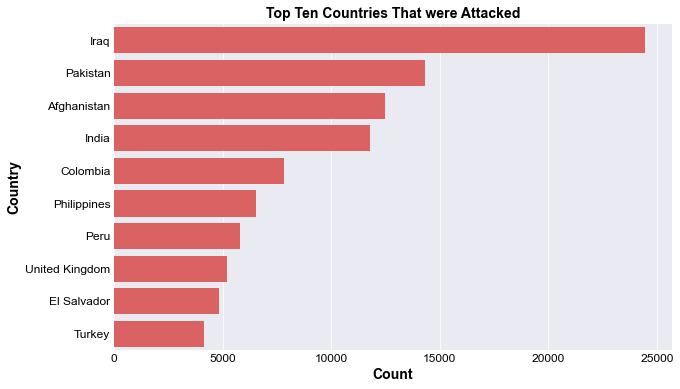

In [197]:
plt.figure(figsize=(10,6))

# Creating a bar plot
sns.barplot(x=no_of_attacks_in_countries.values, y=no_of_attacks_in_countries.index, color='#EE4E4E')

# Adding labels and title
plt.xlabel('Count', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Country', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Top Ten Countries That were Attacked',fontweight="bold", fontsize = 14, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
# Display the plot
plt.show()

### Most Attacked Regions

In [198]:
# Regions that were attacked
no_of_attacks_in_region = df['Region'].value_counts().sort_values(ascending=False)
no_of_attacks_in_region.head()

Region
Middle East & North Africa    49492
South Asia                    44329
South America                 18110
Sub-Saharan Africa            17003
Western Europe                16482
Name: count, dtype: int64

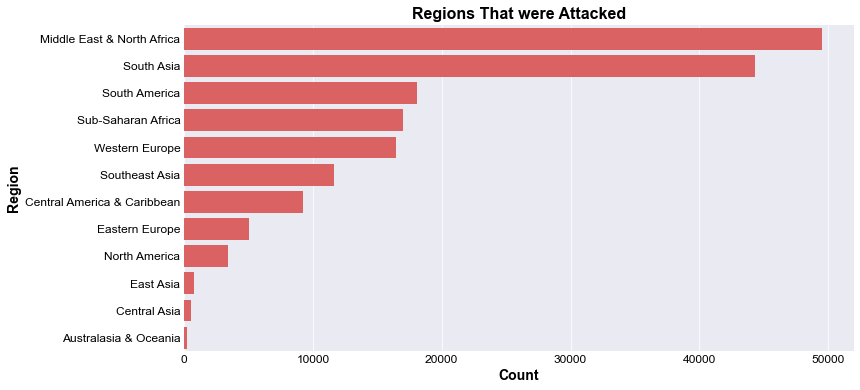

In [199]:
plt.figure(figsize=(12,6))
# Creating a count plot
sns.barplot(x=no_of_attacks_in_region.values,y=no_of_attacks_in_region.index,color='#EE4E4E')

# Adding labels and title
plt.xlabel('Count', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Region', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Regions That were Attacked',fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
# Display the plot
plt.show()

###  Number of Attacks Over Years

In [170]:
attacks_counts = df['Year'].value_counts().sort_values()
attacks_counts.head()

Year
1971    463
1973    464
1972    547
1974    574
1970    641
Name: count, dtype: int64

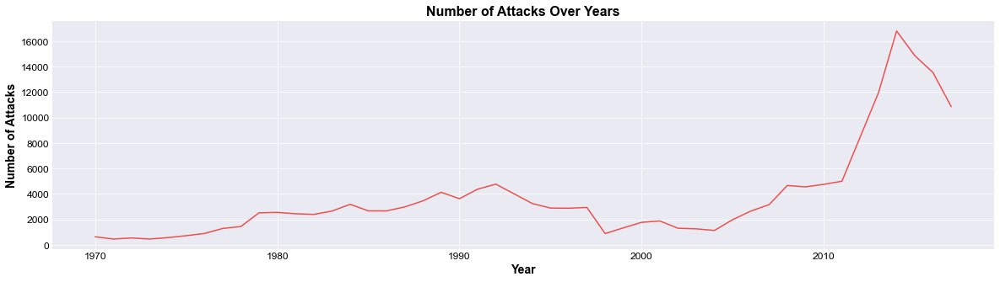

In [172]:
plt.figure(figsize=(20,5))

sns.lineplot(x=attacks_counts.index,y=attacks_counts.values,color='#EE4E4E')
plt.xlabel("Year",fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel("Number of Attacks",fontweight="bold", fontsize = 14, color = 'black')
plt.title("Number of Attacks Over Years",fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
plt.show()

### Number of Total Killed Over Years 

In [210]:
killed_over_years = df.groupby('Year')['Total_killed'].sum()
killed_over_years.head()

Year
1970    135
1971    172
1977    341
1973    368
1974    535
Name: Total_killed, dtype: int32

In [211]:
killed_over_years_desc = df.groupby('Year')['Total_killed'].sum().sort_values(ascending=False)
killed_over_years_desc.head()

Year
2014    44284
2015    38714
2016    34835
2017    26335
2013    22161
Name: Total_killed, dtype: int32

In [ ]:
plt.figure(figsize=(15,5))
killed_over_years.plot(kind="bar",color='#EE4E4E')
plt.xlabel("Year",fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel("Total Killed",fontweight="bold", fontsize = 14, color = 'black')
plt.title("Total Killed Over Years",fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
plt.show()

## Total Killed in Every Region 

In [203]:
killed_over_region = df.groupby('Region')['Total_killed'].sum().sort_values(ascending=False)
killed_over_region

Region
Middle East & North Africa     134639
South Asia                      99389
Sub-Saharan Africa              74920
South America                   26179
Central America & Caribbean     24237
Southeast Asia                  13182
Eastern Europe                   7316
Western Europe                   6673
North America                    4895
East Asia                        1129
Central Asia                      836
Australasia & Oceania             144
Name: Total_killed, dtype: int32

In [ ]:
plt.figure(figsize=(10,6))
# plot bar plot
sns.barplot(x=killed_over_region.values, y=killed_over_region.index,color='#EE4E4E' )
# Adding labels and title
plt.xlabel('Region', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Total Killed', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Total Killed over Region',fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
# Display the plot
plt.show()

## Total Wounded over Region 

In [202]:
wounded_over_region = df.groupby('Region')['Wounded'].sum().sort_values(ascending=False)
wounded_over_region

Region
Middle East & North Africa     212339
South Asia                     139268
Sub-Saharan Africa              51511
Southeast Asia                  24172
North America                   21515
Western Europe                  18241
South America                   16231
Eastern Europe                  11873
East Asia                        9066
Central America & Caribbean      8099
Central Asia                     1860
Australasia & Oceania             226
Name: Wounded, dtype: int32

In [ ]:
plt.figure(figsize=(10,6))
# plot bar plot
sns.barplot(x=wounded_over_region.values, y=wounded_over_region.index,color='#EE4E4E' )
# Adding labels and title
plt.xlabel('Region', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Total Wounded', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Total Wounded over Region',fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
# Display the plot
plt.show()

## Total Killed by Each Attack Type 

In [201]:
killed_by_attack_type = df.groupby('Attack_Type')['Total_killed'].sum().sort_values(ascending=False)
killed_by_attack_type

Attack_Type
Bombing/Explosion                      154764
Armed Assault                          148794
Unknown                                 30119
Assassination                           23844
Hostage Taking (Kidnapping)             23599
Hostage Taking (Barricade Incident)      4453
Hijacking                                3592
Facility/Infrastructure Attack           3577
Unarmed Assault                           797
Name: Total_killed, dtype: int32

In [ ]:
plt.figure(figsize=(12,6))

sns.barplot(x=killed_by_attack_type.values, y=killed_by_attack_type.index,color='#EE4E4E' )
# Adding labels and title
plt.xlabel('Attack Type', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Total Killed', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Total Killed by Attack Type',fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
# Display the plot
plt.show()

### Most Common  Types of Attacks

In [200]:
common_attack_type= df['Attack_Type'].mode()
print(f"Most Common Attack Type : {common_attack_type.values}")

Most Common Attack Type : ['Bombing/Explosion']


In [209]:
attack_types_counts = df['Attack_Type'].value_counts().sort_values(ascending=False)
attack_types_counts

Attack_Type
Bombing/Explosion                      86598
Armed Assault                          40772
Assassination                          18721
Hostage Taking (Kidnapping)            10625
Facility/Infrastructure Attack         10139
Unknown                                 6892
Unarmed Assault                          980
Hostage Taking (Barricade Incident)      956
Hijacking                                615
Name: count, dtype: int64

In [ ]:
plt.figure(figsize=(10,6))
# Creating a bar plot
sns.barplot(x=attack_types_counts.index, y=attack_types_counts.values,color='#EE4E4E' )

# Adding labels and title
plt.xlabel('Attack Type', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Count', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Types of Attacks',fontweight="bold", fontsize = 16, color = 'black')
plt.xticks(fontsize=12,rotation=90,color="black")
plt.yticks(fontsize=12,color="black")
# Display the plot
plt.show()

### Most Common Target 

In [205]:
common_attack_target= df['Target'].mode()
print(f"Most Common Attack Target : {common_attack_target.values}")

Most Common Attack Target : ['Civilians']


In [212]:
attack_targets_counts = df['Target'].value_counts().sort_values(ascending=False)
attack_targets_counts.head()

Target
Civilians     6997
Unknown       5825
Soldiers      3119
Patrol        2906
Checkpoint    2894
Name: count, dtype: int64

In [ ]:
plt.figure(figsize=(10,6))
# Creating a bar plot
sns.barplot(x=attack_targets_counts.index, y=attack_targets_counts.values,color='#EE4E4E' )

# Adding labels and title
plt.xlabel('Attack Target', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Count', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Count of Each Attack Target',fontweight="bold", fontsize = 16, color = 'black')
plt.xticks(fontsize=12,rotation=90,color="black")
plt.yticks(fontsize=12,color="black")
# Display the plot
plt.show()

## Number of Damage Occurance in Countries

In [ ]:
property_counts_in_countries = df.groupby(['Country', 'Property']).size().unstack(fill_value=0)

# Add labels for values (-9 --> 'Unkown', 1 --> 'Yes', 0 --> 'No')
property_counts_in_countries.columns = ['Unknown' if x == -9 else 'Yes' if x == 1 else 'No' for x in property_counts_in_countries.columns]

# Sort by the count of 'Yes'
sorted_counts = property_counts_in_countries.sort_values(by='Yes', ascending=False).head(10)

In [ ]:
sorted_counts.head()

In [ ]:
sorted_counts = sorted_counts.reset_index()

In [ ]:
combined_property_categories = pd.melt(sorted_counts, id_vars=['Country'], value_vars=['Yes', 'No', 'Unknown'],
                        var_name='Property', value_name='Count')
combined_property_categories.head()

In [ ]:
plt.figure(figsize=(16,6))

colors = ['#667BC6','#FFB1B1','#577B8D']
sns.barplot(x='Country', y='Count', hue='Property', data=combined_property_categories,palette=colors)
# Adding labels and title
plt.xlabel('Country', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Count', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Damadge Occurance Due to The Attacks',fontweight="bold", fontsize = 16, color = 'black')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
# Display the plot
plt.show()

## Heatmap 

In [173]:
corr_columns = ['Year','Month','Day','Total_killed','US_Killed','Perpetrator_Killed','Wounded','US_Wounded',
               'Perpetrator_Wounded','Perpetrators','Captured_Perpetrators','Latitude','Longitude']
corr_data = df[corr_columns]

In [184]:
# Save correlation values in csv file
corr.to_csv('Corr_values.csv')

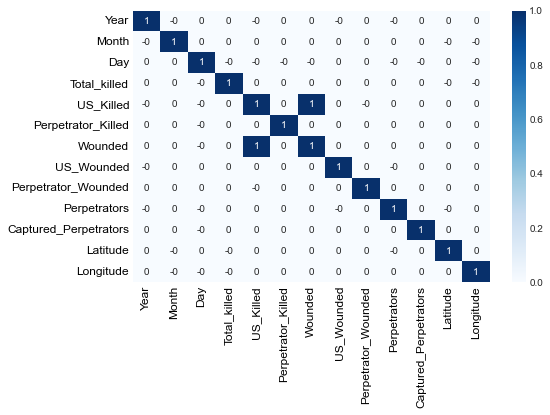

In [191]:
plt.figure(figsize=(8,5))
sns.heatmap(np.round(corr_data.corr()),annot=True,cmap='Blues')
plt.yticks(fontsize=12, color = 'black')
plt.xticks(fontsize=12, color = 'black')
plt.show()

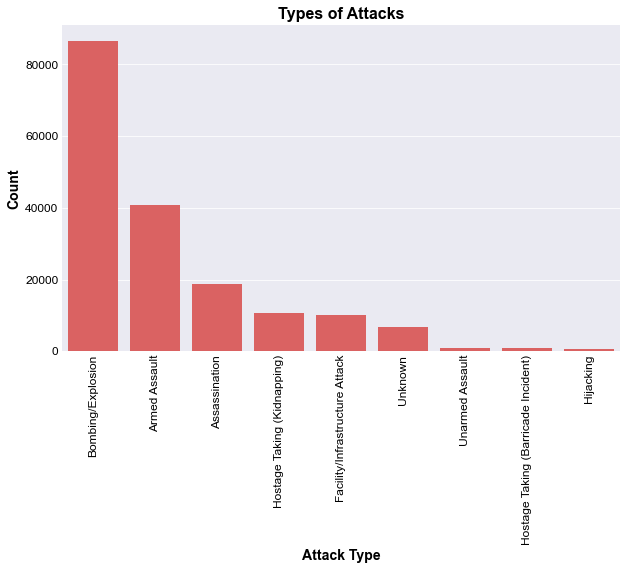

In [187]:
attack_targets_counts = df['Target'].value_counts().sort_values(ascending=False)
attack_targets_counts.head()

attack_types_counts = df['Attack_Type'].value_counts().sort_values(ascending=False)
attack_types_counts

plt.figure(figsize=(10,6))
# Creating a bar plot
sns.barplot(x=attack_types_counts.index, y=attack_types_counts.values,color='#EE4E4E' )

# Adding labels and title
plt.xlabel('Attack Type', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Count', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Types of Attacks',fontweight="bold", fontsize = 16, color = 'black')
plt.xticks(fontsize=12,rotation=90,color="black")
plt.yticks(fontsize=12,color="black")
# Display the plot
plt.show()

## Scatter Plot 

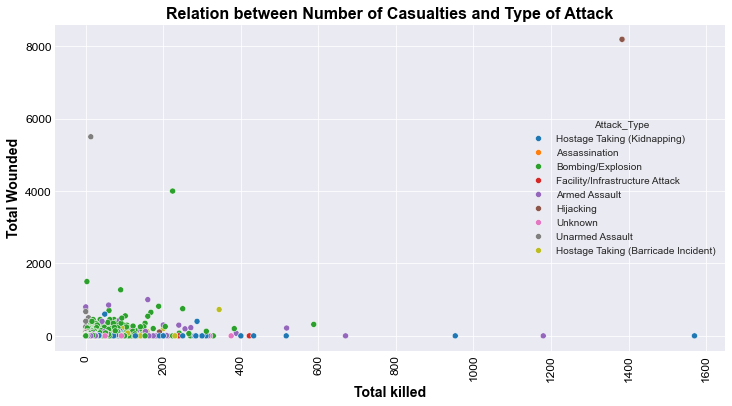

In [182]:
plt.figure(figsize=(12,6))
# Creating a bar plot
sns.scatterplot(x=df['Total_killed'], y=df['Wounded'],hue=df['Attack_Type'],color='#2C4E80' )

# Adding labels and title
plt.xlabel('Total killed', fontweight="bold", fontsize = 14, color = 'black')
plt.ylabel('Total Wounded', fontweight="bold", fontsize = 14, color = 'black')
plt.title('Relation between Number of Casualties and Type of Attack',fontweight="bold", fontsize = 16, color = 'black')
plt.xticks(fontsize=12,rotation=90,color="black")
plt.yticks(fontsize=12,color="black")
# Display the plot
plt.show()

## Map 

In [192]:
# Filter dataframe
filter_year = df['Year'] == 2014
filter_df = df[filter_year] 
columns = filter_df.loc[:,'City':'Longitude'] 
columns_list = columns.values.tolist()
#columns_list

In [194]:
map = folium.Map(location = [0, 30], tiles='CartoDB positron', zoom_start=2)
# clustered marker
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(columns_list)):
    folium.Marker(location=[columns_list[point][1],columns_list[point][2]],
                  popup = columns_list[point][0]).add_to(markerCluster)
map

## Time Series 

In [195]:
import plotly.express as px

# Create a figure
fig = px.scatter_geo(df, lat='Latitude', lon='Longitude', animation_frame='Year',
                     size_max=30, title='Terrorism Spread Over Years',
                     color_continuous_scale='reds')

# Update layout
fig.update_geos(projection_type="orthographic", showcoastlines=True, coastlinecolor="Black",
                showland=True, landcolor="LightGreen", showocean=True, oceancolor="LightBlue",
                showcountries=True, countrycolor="Black")

# Update layout further for zoom and center
fig.update_geos(projection_scale=5)

# Show the animation
fig.show()

# Dask 

In [41]:
#dd_df = dd.read_csv('globalterrorismdb_0718dist.csv', encoding='Windows-1252', low_memory=False)
%%time
ddf = dd.from_pandas(dataset, npartitions=2)

result = ddf.compute()
result.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [ ]:
# Measure memory usage of Dask
memory_usage_dask = ddf.memory_usage(deep=True).compute().sum() 
print(f"Dask Memory Usage: {round(memory_usage_pandas,2)}

In [43]:
# check data types
ddf.dtypes

eventid        int64
iyear          int64
imonth         int64
iday           int64
approxdate    object
               ...  
INT_LOG        int64
INT_IDEO       int64
INT_MISC       int64
INT_ANY        int64
related       object
Length: 135, dtype: object

## Checking Duplicates 

In [ ]:
def find_duplicates(df):
    return df[df.duplicated()]

In [57]:
duplicates = ddf.map_partitions(find_duplicates).compute()
duplicates

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related


## Check Null Values 

In [42]:
# ckeck nulls
nulls = ddf.isnull().sum().compute()
nulls

eventid            0
iyear              0
imonth             0
iday               0
approxdate    172452
               ...  
INT_LOG            0
INT_IDEO           0
INT_MISC           0
INT_ANY            0
related       156653
Length: 135, dtype: int64

In [74]:
null_percent = ddf.isnull().mean().compute() * 100
print(null_percent)

eventid        0.000000
iyear          0.000000
imonth         0.000000
iday           0.000000
approxdate    94.914993
                ...    
INT_LOG        0.000000
INT_IDEO       0.000000
INT_MISC       0.000000
INT_ANY        0.000000
related       86.219461
Length: 135, dtype: float64


In [75]:
columns_to_drop = null_percent[null_percent > 85].index.tolist()
print(columns_to_drop)

['approxdate', 'resolution', 'attacktype2', 'attacktype2_txt', 'attacktype3', 'attacktype3_txt', 'targtype2', 'targtype2_txt', 'targsubtype2', 'targsubtype2_txt', 'corp2', 'target2', 'natlty2', 'natlty2_txt', 'targtype3', 'targtype3_txt', 'targsubtype3', 'targsubtype3_txt', 'corp3', 'target3', 'natlty3', 'natlty3_txt', 'gsubname', 'gname2', 'gsubname2', 'gname3', 'gsubname3', 'guncertain2', 'guncertain3', 'claimmode', 'claimmode_txt', 'claim2', 'claimmode2', 'claimmode2_txt', 'claim3', 'claimmode3', 'claimmode3_txt', 'compclaim', 'weaptype2', 'weaptype2_txt', 'weapsubtype2', 'weapsubtype2_txt', 'weaptype3', 'weaptype3_txt', 'weapsubtype3', 'weapsubtype3_txt', 'weaptype4', 'weaptype4_txt', 'weapsubtype4', 'weapsubtype4_txt', 'nhostkid', 'nhostkidus', 'nhours', 'ndays', 'divert', 'kidhijcountry', 'ransomamt', 'ransomamtus', 'ransompaid', 'ransompaidus', 'ransomnote', 'hostkidoutcome', 'hostkidoutcome_txt', 'nreleased', 'related']


In [76]:
ddf = ddf.drop(columns=columns_to_drop)

In [77]:
result = ddf.compute()
print(result)

             eventid  iyear  imonth  iday  extended  country  \
0       197000000001   1970       7     2         0       58   
1       197000000002   1970       0     0         0      130   
2       197001000001   1970       1     0         0      160   
3       197001000002   1970       1     0         0       78   
4       197001000003   1970       1     0         0      101   
...              ...    ...     ...   ...       ...      ...   
181686  201712310022   2017      12    31         0      182   
181687  201712310029   2017      12    31         0      200   
181688  201712310030   2017      12    31         0      160   
181689  201712310031   2017      12    31         0       92   
181690  201712310032   2017      12    31         0      160   

               country_txt  region                   region_txt  \
0       Dominican Republic       2  Central America & Caribbean   
1                   Mexico       1                North America   
2              Philippines    